In [96]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

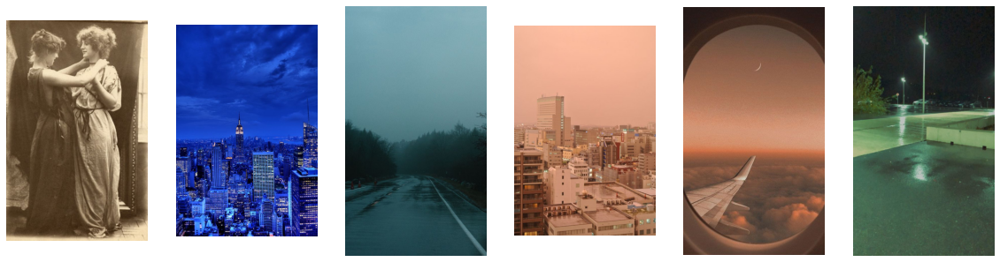

In [109]:
path = 'data/'
imgNames = ['Photo06','Photo08','Photo09','Photo10','Photo11','Photo12']

imgs = []
for i in imgNames:
    img = cv2.imread(path + i + '.jpg')
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    imgs.append(img)
    
plt.rcParams['figure.figsize'] = [20, 20]
imgPos = 1
for i in imgs:
    plt.subplot(1,len(imgs), imgPos), plt.imshow(i)
    plt.axis(False)
    imgPos += 1


<b>White patch</b>

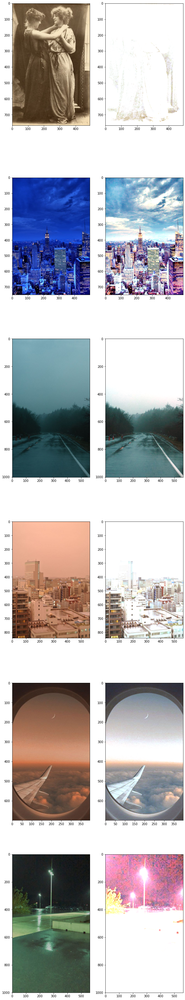

In [144]:
# Define white patch and the coefficients
# according to:'Photo06','Photo08','Photo09','Photo10','Photo11','Photo12'
whiteXY = []
whiteXY.append( [377,176] ) #Photo06
whiteXY.append( [438,538] ) #Photo08
whiteXY.append( [549,54] ) #Photo09
whiteXY.append( [375,733] ) #Photo10
whiteXY.append( [215,174] ) #Photo11
whiteXY.append( [158,480] ) #Photo12

imgPos = 1
plt.rcParams['figure.figsize'] = [10, 60]
for i in imgs:
    white = i[whiteXY[c][0], whiteXY[c][1], :]
    coeff = 255.0/white
    
    balanced = np.zeros_like(i, dtype=np.float32)
    for channel in range(3):
        balanced[..., channel] = i[..., channel] * coeff[channel]
        
    balanced = balanced/255
    balanced[balanced > 1] = 1

    plt.subplot(len(imgs), 2, imgPos), plt.imshow(i)
    plt.subplot(len(imgs), 2, imgPos + 1), plt.imshow(balanced)
    imgPos += 2
    



#a bit complicated to find valid 'white point' on these images

<b>Gray world</b>

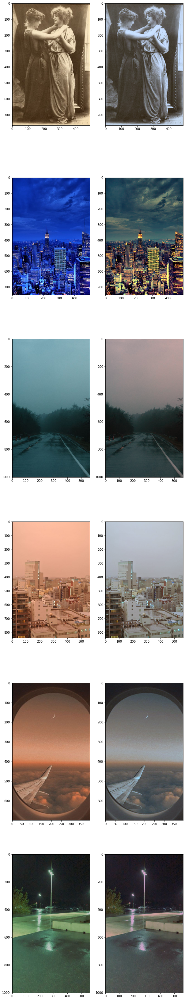

In [171]:
imgPos = 1
for i in imgs:
    mean_r = np.mean(i [: , : , 0])
    mean_g = np.mean(i [: , : , 1])
    mean_b = np.mean(i [: , : , 2])
    grey = np.mean( [mean_r, mean_g, mean_b] )
    #meanMax = np.max( [mean_r, mean_g, mean_b] )
    
    kr = mean_r/ grey;
    kg = mean_g/ grey;
    kb = mean_b/ grey;
    k = [kr, kg, kb]
    
    greyWorldImg = np.zeros_like(i, dtype=np.float32)
    for channel in range(3):
        greyWorldImg[..., channel] = i[..., channel] / k[channel]
    
    greyWorldImg = greyWorldImg/255
    greyWorldImg[greyWorldImg > 1] = 1

    plt.subplot(len(imgs), 2, imgPos), plt.imshow(i)
    plt.subplot(len(imgs), 2, imgPos + 1), plt.imshow(greyWorldImg)
    imgPos += 2
    

<b>Scale-by-max</b>

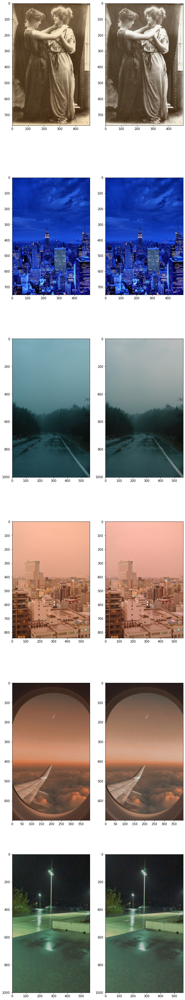

In [168]:
imgPos = 1
for i in imgs:
    max_r = np.max(i [: , : , 0])
    max_g = np.max(i [: , : , 1])
    max_b = np.max(i [: , : , 2])
    maxValue = np.max( [max_r, max_g, max_b] )
    
    kr = max_r/ maxValue;
    kg = max_g/ maxValue;
    kb = max_b/ maxValue;
    k = [kr, kg, kb]
    
    greyWorldImg = np.zeros_like(i, dtype=np.float32)
    for channel in range(3):
        greyWorldImg[..., channel] = i[..., channel] / k[channel]
    
    greyWorldImg = greyWorldImg/255
    greyWorldImg[greyWorldImg > 1] = 1

    plt.subplot(len(imgs), 2, imgPos), plt.imshow(i)
    plt.subplot(len(imgs), 2, imgPos + 1), plt.imshow(greyWorldImg)
    imgPos += 2

<h2>Thanks for viewing!</h2> ❤️️

average values:
[1.2268078187100244, 1.0185160593904998, 0.7546761218994756]
median values:
[1.2528735632183907, 1.0, 0.7011494252873564]
average values:
[0.35014498917518355, 0.7006343015875814, 1.949220709237235]
median values:
[0.34615384615384615, 1.0, 3.1923076923076925]
average values:
[0.728064793935021, 1.1004357944020178, 1.1714994116629611]
median values:
[0.6440677966101694, 1.0, 1.0677966101694916]
average values:
[1.3152073505850177, 0.9368258161636486, 0.7479668332513332]
median values:
[1.3733333333333333, 1.0, 0.8]
average values:
[1.348238904755257, 0.9306320225944471, 0.7211290726502961]
median values:
[1.4777777777777779, 1.0, 0.7555555555555555]
average values:
[0.8946618765585912, 1.175192993611241, 0.9301451298301673]
median values:
[0.9836065573770492, 1.278688524590164, 1.0]


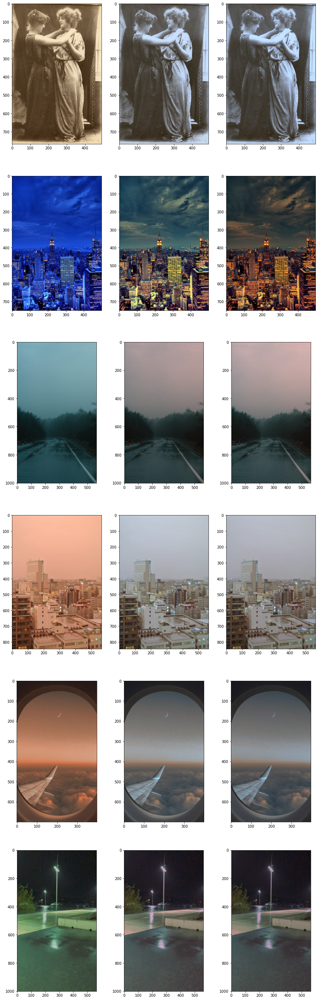

In [180]:
#test with median function
plt.rcParams['figure.figsize'] = [15, 50]
imgPos = 1
for i in imgs:
    #average grays
    mean_r = np.mean(i [: , : , 0])
    mean_g = np.mean(i [: , : , 1])
    mean_b = np.mean(i [: , : , 2])
    grey = np.mean( [mean_r, mean_g, mean_b] )
    
    kr = mean_r/ grey;
    kg = mean_g/ grey;
    kb = mean_b/ grey;
    k = [kr, kg, kb]
    print('average values:')
    print(k)
    
    greyWorldImg = np.zeros_like(i, dtype=np.float32)
    for channel in range(3):
        greyWorldImg[..., channel] = i[..., channel] / k[channel]
    
    greyWorldImg = greyWorldImg/255
    greyWorldImg[greyWorldImg > 1] = 1
    
    #median greys
    med_r = np.median(i [: , : , 0])
    med_g = np.median(i [: , : , 1])
    med_b = np.median(i [: , : , 2])
    medGrey = np.median( [med_r, med_g, med_b] )
    
    mkr = med_r/ medGrey;
    mkg = med_g/ medGrey;
    mkb = med_b/ medGrey;
    mk = [mkr, mkg, mkb]
    print('median values:')
    print(mk)
    
    medianImg = np.zeros_like(i, dtype=np.float32)
    for channel in range(3):
        medianImg[..., channel] = i[..., channel] / mk[channel]
    
    medianImg = medianImg/255
    medianImg[medianImg > 1] = 1

    #output
    plt.subplot(len(imgs), 3, imgPos), plt.imshow(i)
    plt.subplot(len(imgs), 3, imgPos + 1), plt.imshow(greyWorldImg)
    plt.subplot(len(imgs), 3, imgPos + 2), plt.imshow(medianImg)
    imgPos += 3